Download Data

In [1]:
import utils

utils.download_data()
compositions, uc_params, imgdata = utils.parse_files()
SBFO_data = utils.process_data(compositions, uc_params, imgdata)

The code below displays five image acquisitions from the dataset, along with their respective histograms.

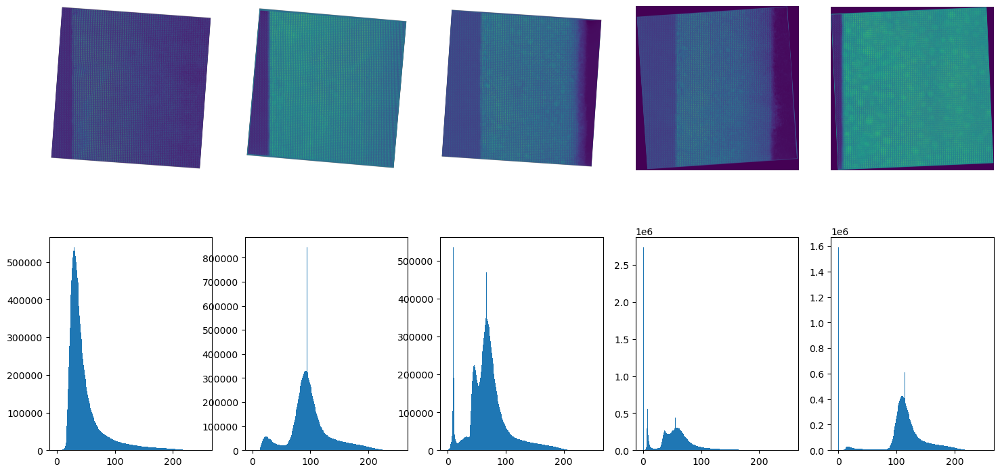

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

target = Path('sample_imgs')
target.mkdir(exist_ok=True)

fig, axes = plt.subplots(2,len(SBFO_data), figsize=(18,9))
for i, (im, ax, ax2) in enumerate(zip(SBFO_data, axes[0], axes[1])):
    ax.imshow(im['image'])
    ax.set_axis_off()
    
    # Image histogram
    ax2.hist(im['image'][:].ravel(), bins=256, range=(0, 255), fc='k', ec='k')

    if not (target / f"sample_{i}.png").exists():
        img = Image.fromarray(im['image'][:])
        img = img.convert("L")  # Convert to grayscale
        img.save(target / f"sample_{i}.png")

# Data Preparation

Using cached data: True
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 45240


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Number of regions with size >= 200: 233
Plotting and saving Pruned atoms: 45008
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 47120
Number of regions with size >= 200: 185
Plotting and saving Pruned atoms: 46936
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 44444
Number of regions with size >= 200: 566
Plotting and saving Pruned atoms: 43879
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 46215
Number of regions with size >= 200: 731
Plotting and saving Pruned atoms: 45485
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 46834
Number of regions with size >= 200: 234
Plotting and saving Pruned atoms: 46601


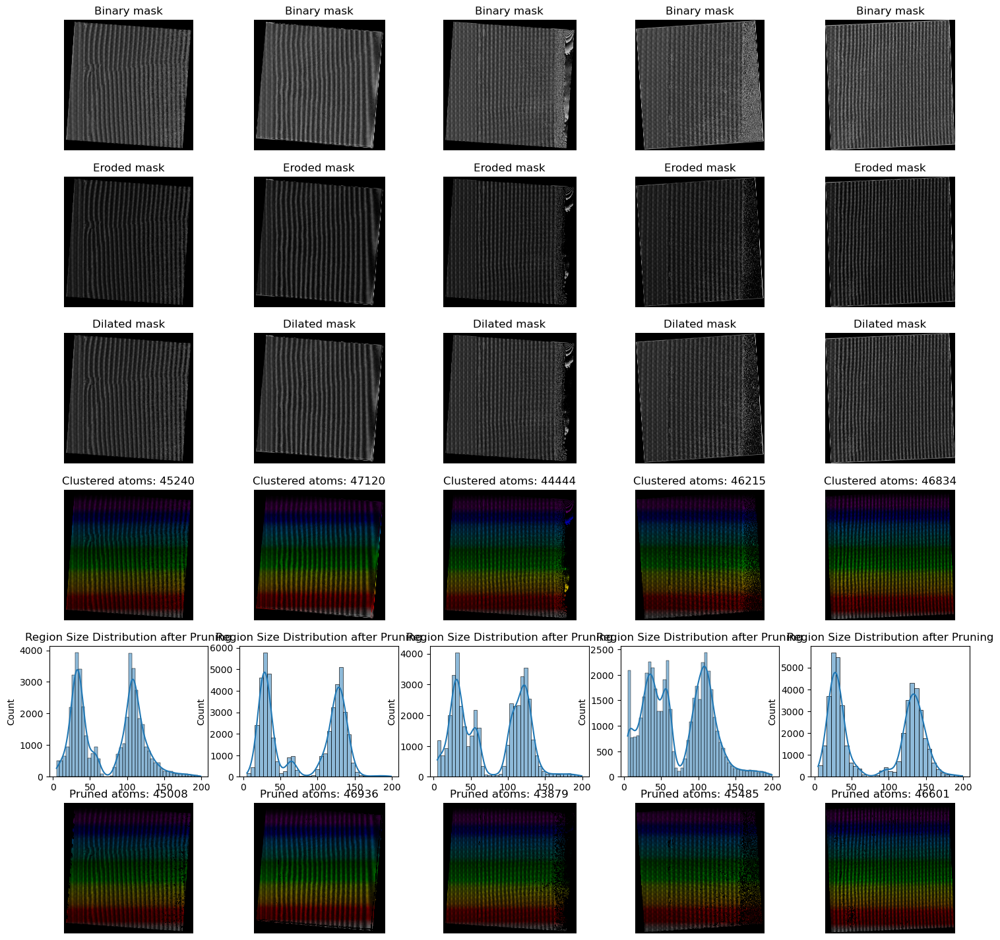

In [3]:
from pipeline import binarize, plot_and_save, find_atoms, prune_regions, find_sizes
from skimage.morphology import binary_erosion, binary_dilation, disk
import pickle
import numpy as np
import seaborn as sns
import matplotlib as mpl

cached = Path('data/processed_images.pkl').exists()
print(f"Using cached data: {cached}")
images = pickle.load(open('data/processed_images.pkl', 'rb')) if cached else {}

x = []
y = []

fig, axes = plt.subplots(6,len(SBFO_data), figsize=(18,18))
for i, (im, (ax, ax2, ax3, ax4, ax5, ax6)) in enumerate(zip(SBFO_data, axes.T)):
    data = {}
    x.append(im['image'][:])

    # Binarize the image
    binary = binarize(im['image'][:]) if not cached else images[i]['binary']
    data['binary'] = binary
    plot_and_save(binary, target/f"sample_{i}_binary.png", "Binary mask", ax)

    # Erode the binary image to try and improve separation between atoms
    eroded = binary_erosion(binary, disk(2)) if not cached else images[i]['eroded']
    data['eroded'] = eroded
    plot_and_save(eroded, target/f"sample_{i}_eroded.png", "Eroded mask", ax2)
    
    # Dilate the eroded image to return atoms to original size
    dilated = binary_dilation(eroded, disk(1)) if not cached else images[i]['dilated']
    data['dilated'] = dilated
    plot_and_save(dilated, target/f"sample_{i}_dilated.png", "Dilated mask", ax3)
    
    labels = find_atoms(dilated) if not cached else images[i]['clf']
    data['clf'] = labels
    plot_and_save(labels, target/f"sample_{i}_clf.png", f"Clustered atoms: {len(np.unique(labels))}", ax4, color=True)

    # Remove classes with too many pixels
    # This is representative of regions that are too large to be atoms
    # and are likely to be noise/artifacts
    
    cutoff = 200
    sizes, class_sizes, num_greater = find_sizes(labels, cutoff=cutoff)
    print(f"Number of regions with size >= {cutoff}: {num_greater}")
    pruned_labels = prune_regions(class_sizes, labels) if not cached else images[i]['pruned']
    data['pruned'] = pruned_labels

    sns.histplot(np.array(list(class_sizes.values())), ax=ax5, kde=True)
    ax5.set_title("Region Size Distribution after Pruning")
    plot_and_save(pruned_labels, target/f"sample_{i}_clf_pruned.png", f"Pruned atoms: {len(np.unique(pruned_labels))}", ax6, color=True)
    
    y.append(labels)
    if not cached:
        images[i] = data

In [4]:
if not cached:
    with open(Path('data') / "processed_images.pkl", "wb") as f:
        pickle.dump(images, f)

# Image/CNN Workflow

In [5]:
x = [np.nan_to_num(arr, nan=0) for arr in x]

In [6]:
print("Image Shapes:")
for i in range(len(x)):
    print("idx", i, len(x[i]), len(x[i][0]))

Image Shapes:
idx 0 4454 4405
idx 1 4520 4527
idx 2 4375 4443
idx 3 4397 4348
idx 4 4268 4245


In [7]:
print("Label Shapes:")
for i in range(len(y)):
    print("idx", i, len(y[i]), len(y[i][0]))

Label Shapes:
idx 0 4454 4405
idx 1 4520 4527
idx 2 4375 4443
idx 3 4397 4348
idx 4 4268 4245


Calculate some statistics about each atom region.

In [8]:
import polars as pl
import numba

# Numba Optimized
def numba_class_stats(data):
    @numba.njit(fastmath=True, parallel=True)
    def get_stats(data):
        all_outputs = np.zeros((len(np.unique(data)) - 1, 6))
        classes = np.unique(data)[1:]
        for ind in numba.prange(classes.size):
            c = classes[ind]
            x, y = np.where(c == data)
            all_outputs[ind] = [c, x.size, np.median(x), np.median(y), np.std(x), np.std(y)]
        return all_outputs

    output_np = get_stats(data)
    cols_dtypes = {
        'class': pl.UInt32, 
        'size': pl.UInt32, 
        'median_x': pl.UInt32, 
        'median_y': pl.UInt32, 
        'std_x': pl.Float32, 
        'std_y': pl.Float32
    }
    output = pl.DataFrame(output_np, schema=cols_dtypes)    
    return output

Plot them

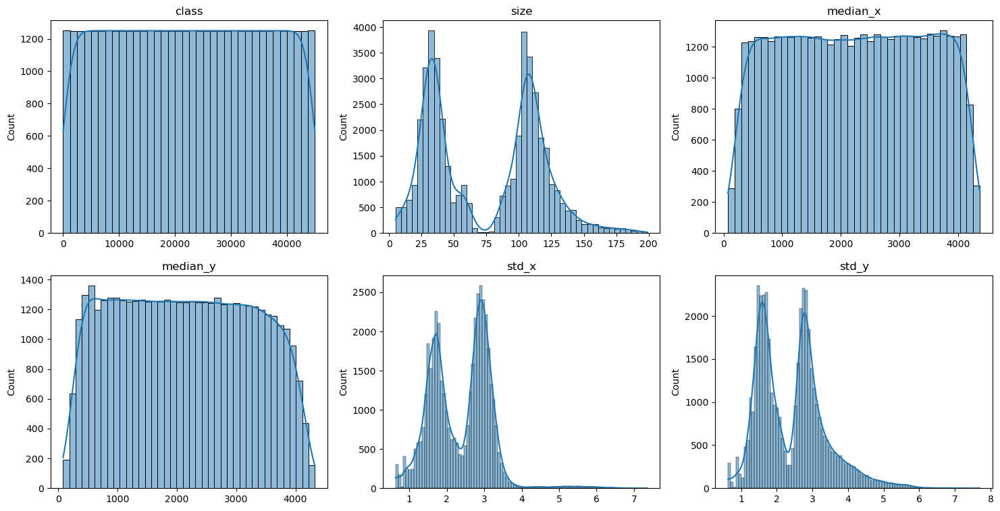

In [9]:
class_data = numba_class_stats(images[0]['pruned'])
fig, axes = plt.subplots(2, len(class_data.columns)//2, figsize=(18, 9))
for i, (col, ax) in enumerate(zip(class_data.columns, axes.flatten())):
    sns.histplot(class_data[col], ax=ax, kde=True)
    ax.set_title(col)

In [10]:
def extract_windows(x, y, window_size, stride):
    # Initialize lists to hold the windows
    windows_x = []
    windows_y = []
    
    # Loop over each image in x and corresponding label in y
    for img, label in zip(x, y):
        height, width = img.shape
        
        # Calculate the number of windows in height and width
        num_windows_x = (height - window_size) // stride + 1
        num_windows_y = (width - window_size) // stride + 1
        
        # Slide over the image and label to extract windows
        for i in range(num_windows_x):
            for j in range(num_windows_y):
                start_i = i * stride
                start_j = j * stride
                
                window_x = img[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from image
                window_y = label[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from label
                
                # Append to the list of windows
                windows_x.append(window_x)
                windows_y.append(window_y)
    
    # Convert lists to numpy arrays
    windows_x = np.array(windows_x)
    windows_y = np.array(windows_y)
    
    return windows_x, windows_y

#Needs a lot of memory, adjust stride/window size to conserve

stride = 16
window_size = 32  # N
windows_x, windows_y = extract_windows(x, y, window_size, stride)

print("Dataset Size:", len(windows_x))

Dataset Size: 373601


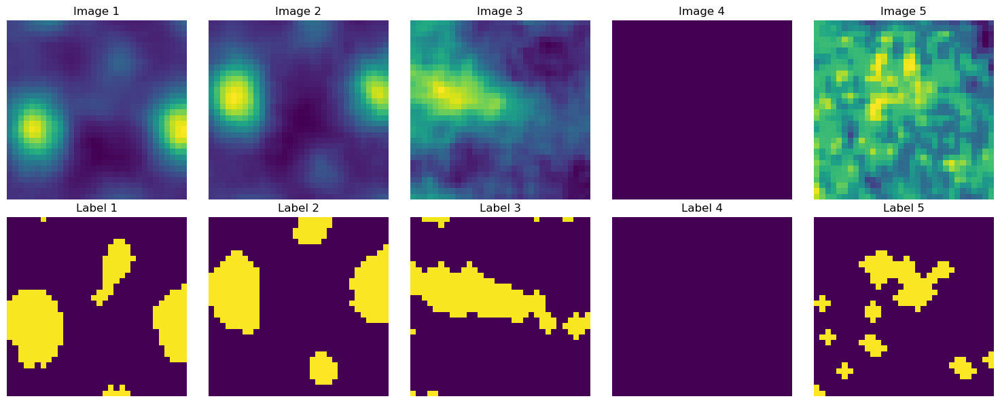

In [11]:
num_samples = 5
random_indices = np.random.choice(len(windows_x), num_samples, replace=False)

fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
for i, idx in enumerate(random_indices):
    # Image window
    axes[0, i].imshow(windows_x[idx], cmap='viridis')
    axes[0, i].set_title(f"Image {i+1}")
    axes[0, i].axis('off')
    
    # Label window
    axes[1, i].imshow(windows_y[idx])
    axes[1, i].set_title(f"Label {i+1}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Define the Autoencoder model
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(32 * 32, 128),  # Input size adjusted to 32x32
            nn.ReLU(),
            nn.Linear(128, 32)  # Bottleneck layer
        )
        self.decoder = nn.Sequential(
            nn.Linear(32, 128),
            nn.ReLU(),
            nn.Linear(128, 2 * 32 * 32),  # Output size adjusted to 2 classes (0 and 1)
            nn.Unflatten(1, (2, 32, 32))  # Unflatten to (batch_size, 2, 32, 32) for two classes
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

def train(model, dataloader, criterion, optimizer, epochs=1):
    model.train()
    total_loss = 0
    for data in dataloader:
        inputs, targets = data
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    return total_loss / len(dataloader)

# Accuracy function
def compute_accuracy(model, dataloader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in dataloader:
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)  # Get the predicted class 
            targets = targets.squeeze(1)  # Remove the channel dimension
            correct += (preds == targets).sum().item()
            total += targets.numel()
    accuracy = correct / total
    return accuracy

# Convert data to PyTorch tensors
x_tensor = torch.tensor(windows_x, dtype=torch.float32)  # Shape: (N, 1, 32, 32)
y_tensor = torch.tensor(windows_y, dtype=torch.long)  # Labels are integers (0 or 1)

# Check if the labels are binary
print(torch.min(y_tensor), torch.max(y_tensor))  # Ensure this prints 0 and 1

# If necessary, clamp the labels to ensure they are within the valid range
y_tensor = torch.clamp(y_tensor, 0, 1)

# Create a DataLoader
dataset = TensorDataset(x_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

# Initialize the model, loss, and optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Autoencoder().to(device)
criterion = nn.CrossEntropyLoss()  # Sparse Cross-Entropy Loss for binary outputs
optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-8)

#Decaying Lr
decayRate = 0.99
my_lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=decayRate)

In [ ]:
# List to store the learning rates
learning_rates = []
losses = []
accs = []

epochs = 10

# Train the model
for epoch in range(1, epochs+1):
    # Training for one epoch at a time
    train_loss = train(model, dataloader, criterion, optimizer, epochs=1)  # Assuming train returns loss

    # Update the learning rate
    my_lr_scheduler.step()

    # Get current learning rate
    current_lr = optimizer.param_groups[0]['lr']

    # Compute current accuracy
    accuracy = compute_accuracy(model, dataloader)

    # Print the current epoch, loss, accuracy, and learning rate
    print(f"Epoch [{epoch}/{epochs}] | Loss: {train_loss:.4f} | Accuracy: {accuracy:.4f} | LR: {current_lr:.6f}")

    # Append the current learning rate, losses, and accs
    learning_rates.append(current_lr)
    losses.append(train_loss)
    accs.append(accuracy)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plot Learning Rate
ax[0].plot(range(1, epochs+1), learning_rates, color='blue')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Learning Rate')
ax[0].set_title('Learning Rate Decay Over Epochs')
ax[0].grid(True)

# Plot Accuracy
ax[1].plot(range(1, epochs+1), accs, color='green')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Accuracy Over Epochs')
ax[1].grid(True)

# Plot Loss
ax[2].plot(range(1, epochs+1), losses, color='red')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Loss')
ax[2].set_title('Loss Over Epochs')
ax[2].grid(True)

# Show the plots
plt.tight_layout()
plt.show()

In [ ]:
# Visualize original and reconstructed images
model.eval()
with torch.no_grad():
    sample, _ = next(iter(dataloader))
    sample = sample.to(device)
    outputs = model(sample)

    # If the output is multi-class (num_classes > 1), take the class with the highest logit
    if outputs.dim() == 4:  # Shape is (batch_size, num_classes, height, width)
        # Get the class with the highest logit for each pixel
        _, predicted = torch.max(outputs, 1)  # Predicted shape: (batch_size, height, width)
        predicted = predicted.unsqueeze(1)  # Add channel dimension for visualization
    else:
        predicted = outputs

    # Plot original and reconstructed images
    fig, axes = plt.subplots(2, 10, figsize=(10, 4))
    for i in range(10):
        axes[0, i].imshow(sample[i].cpu().squeeze(), cmap="gray")
        axes[0, i].axis("off")
        axes[1, i].imshow(predicted[i].cpu().squeeze(), cmap="gray")
        axes[1, i].axis("off")
    plt.show()

In [ ]:
from sklearn.manifold import TSNE

# Extract the latent representations from the model
latent_space = []
labels = []

# Iterate over the data loader to get the latent representations
model.eval()  # Set the model to evaluation mode
with torch.no_grad():  # Disable gradient tracking
    for data in dataloader:
        inputs, targets = data
        # Assuming the model has an encoder function that gives the latent representation
        # If using VAE, this could be model.encode(inputs)
        latent = model.encoder(inputs)  # Replace with the actual encoding function from your model
        latent_space.append(latent.numpy())  # Collect the latent representations
        labels.append(targets.numpy())  # Collect the corresponding labels (if needed for coloring)

# Convert lists to numpy arrays
latent_space = np.concatenate(latent_space, axis=0)
labels = np.concatenate(labels, axis=0)

# Reduce dimensionality to 2D using t-SNE
tsne = TSNE(n_components=2, random_state=42)
latent_2d = tsne.fit_transform(latent_space)

#  Plot the 2D latent space
plt.figure(figsize=(8, 6))
plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, cmap='viridis', alpha=0.7)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('2D Latent Space Visualization')
plt.colorbar(label='Labels') 
plt.grid(True)
plt.show()

# Graph Workflow

In [12]:
# Calculate nearest neighbor distances of 4 nearest neighbors
# The data consists of a 2d array where the non-zero values are the regions
# The distance should be the euclidean distance between the centroids of the regions
# The output should be a 2d array of shape (n, 4) where n is the number of regions
# The output should be the distances and the indices of the nearest neighbors

@numba.njit(fastmath=True, parallel=True)
def get_nearest_neighbors(centroids: np.ndarray):
    dists = np.zeros((centroids.shape[0], 4))
    indices = np.zeros((centroids.shape[0], 4))
    for i in numba.prange(centroids.shape[0]):
        dist = np.sqrt(np.sum((centroids - centroids[i]) ** 2, axis=1))
        sorted_indices = np.argsort(dist)[1:5]  # Skip the first one because it's the point itself
        dists[i] = dist[sorted_indices]
        indices[i] = sorted_indices
    return dists, indices.astype(np.uint32)

centroids = np.array(
    [
        class_data['median_x'].to_numpy(), 
        class_data['median_y'].to_numpy()
    ]
).T
dists, indices = get_nearest_neighbors(centroids)
print(dists, indices)
print(dists.shape, indices.shape)

[[13.89244399 31.89043744 33.83784863 38.07886553]
 [13.89244399 18.43908891 25.01999201 25.07987241]
 [17.69180601 18.43908891 25.01999201 25.07987241]
 ...
 [14.4222051  18.02775638 28.16025568 35.        ]
 [15.55634919 20.         26.07680962 27.01851217]
 [15.55634919 19.41648784 24.         27.01851217]] [[    1    12    27     2]
 [    0    12    27     2]
 [   12    13     3     1]
 ...
 [44998 44989 45006 44987]
 [45000 44999 44986 45006]
 [44999 44998 44987 45005]]
(45007, 4) (45007, 4)


{'centroid': array([ 75, 391], dtype=uint32), 'size': 10}


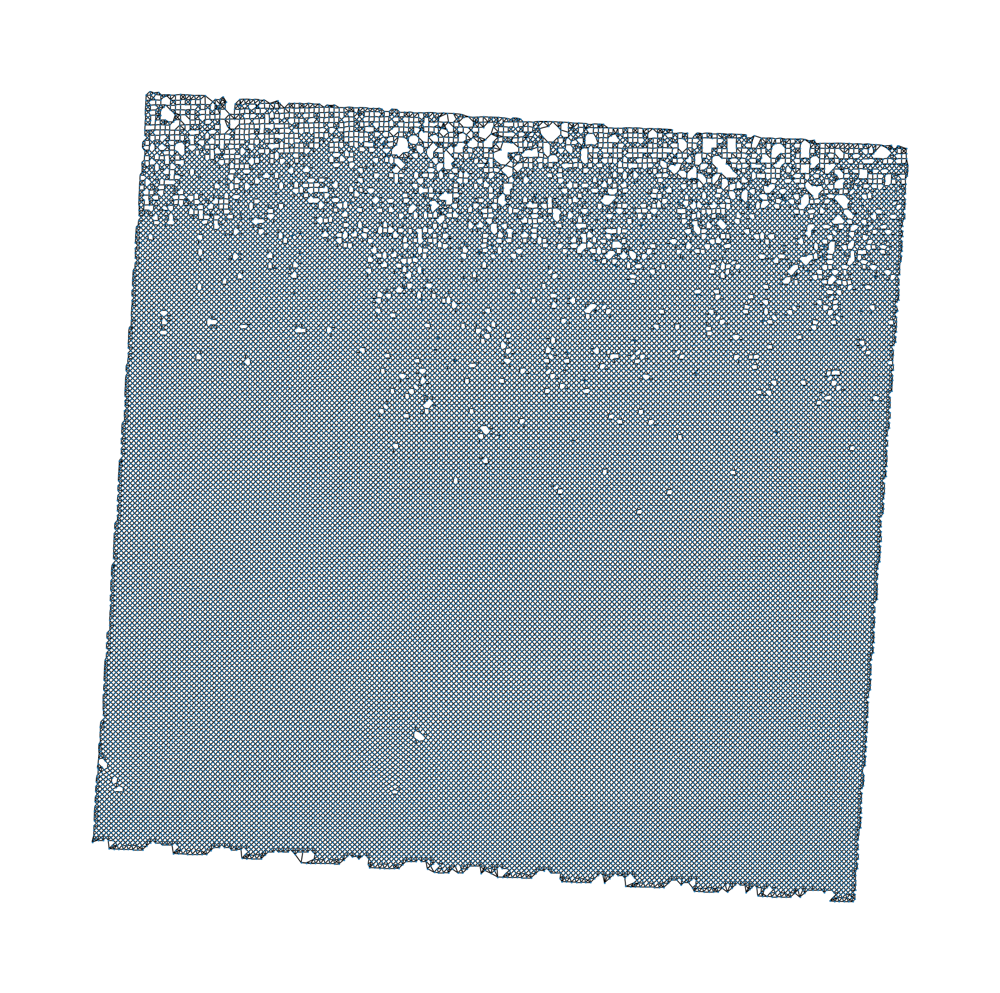

In [13]:
# Construct a graph of the regions where the nodes are the regions and the edges are the nearest neighbors
# The graph should be represented as a networkx graph, where the nodes are the region indices and the edges are the distances
# The graph should be undirected and the nodes should contain the centroid coordinates
from networkx import Graph
import networkx as nx

def construct_graph(dists, indices, centroids):
    G = Graph()
    for i, (dist, idx) in enumerate(zip(dists, indices)):
        for d, j in zip(dist, idx):
            G.add_edge(i, j, weight=d)
        G.nodes[i]['centroid'] = centroids[i]
        G.nodes[i]['size'] = class_data['size'][i]
    return G

G = construct_graph(dists, indices, centroids)
print(G.nodes[0])

# Plot the graph with the nodes colored by the region size
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_size=1, ax=ax)
plt.show()

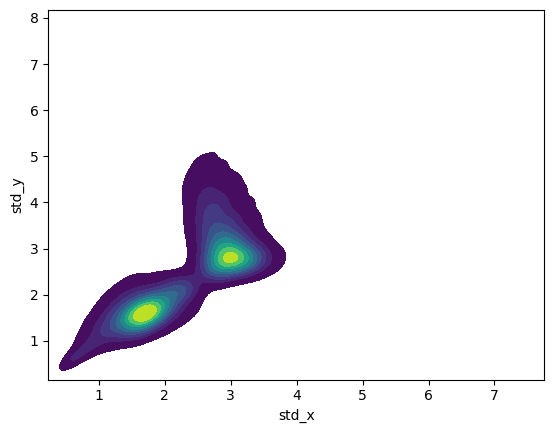

<Figure size 640x480 with 0 Axes>

In [14]:
from matplotlib.colors import to_rgba
import matplotlib.cm as cm

cmap = cm.get_cmap('viridis')
background_color = to_rgba(cmap(0))

fig, ax = plt.subplots(figsize=(8, 6))

# Draw a rectangle to fill the entire axes background
ax.add_patch(plt.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                           color=background_color, zorder=0))
sns.kdeplot(data=class_data, x='std_x', y='std_y', fill=True, cmap='viridis')

shape: (45_007, 6)
┌───────┬──────┬──────────┬──────────┬──────────┬──────────┐
│ class ┆ size ┆ median_x ┆ median_y ┆ std_x    ┆ std_y    │
│ ---   ┆ ---  ┆ ---      ┆ ---      ┆ ---      ┆ ---      │
│ u32   ┆ u32  ┆ u32      ┆ u32      ┆ f32      ┆ f32      │
╞═══════╪══════╪══════════╪══════════╪══════════╪══════════╡
│ 1     ┆ 10   ┆ 75       ┆ 391      ┆ 0.9      ┆ 0.9      │
│ 2     ┆ 99   ┆ 82       ┆ 403      ┆ 2.989865 ┆ 2.814686 │
│ 3     ┆ 93   ┆ 84       ┆ 428      ┆ 2.960526 ┆ 2.524387 │
│ 4     ┆ 87   ┆ 85       ┆ 453      ┆ 2.932319 ┆ 2.37956  │
│ 5     ┆ 82   ┆ 85       ┆ 477      ┆ 2.756124 ┆ 2.384139 │
│ …     ┆ …    ┆ …        ┆ …        ┆ …        ┆ …        │
│ 45003 ┆ 120  ┆ 4361     ┆ 4004     ┆ 2.928974 ┆ 3.588552 │
│ 45004 ┆ 145  ┆ 4362     ┆ 4029     ┆ 2.848401 ┆ 4.502894 │
│ 45005 ┆ 16   ┆ 4367     ┆ 3886     ┆ 1.165922 ┆ 1.165922 │
│ 45006 ┆ 28   ┆ 4371     ┆ 3941     ┆ 1.533636 ┆ 1.519852 │
│ 45007 ┆ 5    ┆ 4370     ┆ 3914     ┆ 0.632456 ┆ 0.632456 │
└────

/var/folders/lw/zc6lj6113hnbysn306v829_c0000gn/T/ipykernel_8788/3658167848.py:8: NumbaTypeSafetyWarning: unsafe cast from int64 to uint32. Precision may be lost.
  class_map[0] = 0


[0 1 2]


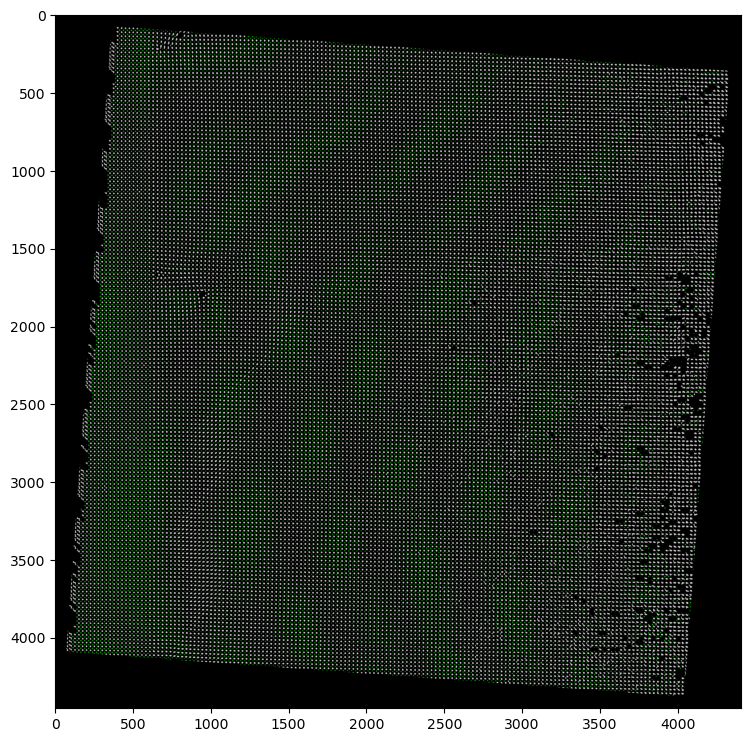

In [15]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

print(class_data)
@numba.njit(fastmath=True, parallel=True)
def reassign_classes(org_img: np.ndarray, org_classes: np.ndarray, y_pred: np.ndarray):
    class_map = dict(zip(org_classes,y_pred))
    class_map[0] = 0
    output = np.zeros_like(org_img)

    n_row, n_col = org_img.shape
    for row_i in numba.prange(n_row):
        for col_i in numba.prange(n_col):
            output[row_i][col_i] = class_map[org_img[row_i][col_i]]
    return output

# Cluster the data
feats = ['std_x', 'std_y', 'size']#, 'median_x', 'median_y']
# y_pred = KMeans(n_clusters=2, random_state=42).fit_predict(class_data[feats]) + 1
y_pred = GaussianMixture(n_components=2, random_state=42).fit_predict(class_data[feats]) + 1
# y_pred = class_data['size'].to_numpy() > 50
# y_pred = y_pred.astype(np.uint32) + 1
org_img = images[0]['pruned'].astype(np.uint32)
org_classes = class_data['class'].to_numpy()

new_labels = reassign_classes(
    org_img, 
    org_classes, 
    y_pred
)
print(np.unique(new_labels))

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(9, 9))
ax.imshow(new_labels, cmap='nipy_spectral')

cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(new_labels))))
colored_new_labels = np.array([cm[label] for label in new_labels])
colored_new_labels = (colored_new_labels * 255).astype(np.uint8)  # Convert to uint8

img = Image.fromarray(colored_new_labels)
img.save(target/f"sample_{0}_gmm.png")

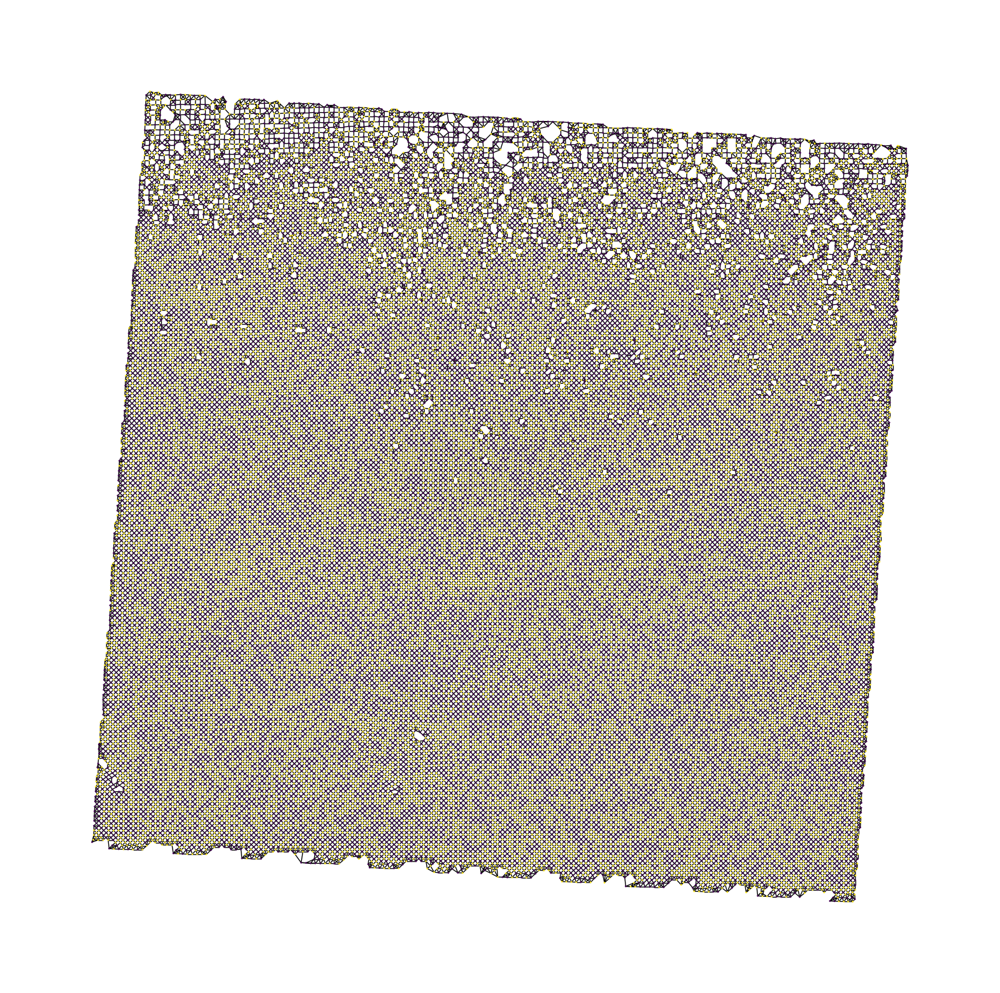

In [16]:
# Plot the graph colored by the new classes
G = construct_graph(dists, indices, centroids)
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_color=y_pred, node_size=1, ax=ax)
plt.show()